In [2]:
import glob
import numpy as np
import os
import matplotlib.pyplot as plt
%matplotlib inline

### Use your own `caffe_root` directory below

In [3]:
import sys
caffe_root = '/home/psoulos/bin/caffe/'
sys.path.insert(0, caffe_root + 'python')
import caffe

In [4]:
model_dir = 'models/'

basic_model_def = os.path.join(model_dir, 'alexnet_basic_deploy.prototxt')
basic_model_weights = os.path.join(model_dir, 'alexnet_basic_400k.caffemodel')

finetune_model_def = os.path.join(model_dir, 'alexnet_finetune_deploy.prototxt')
finetune_model_weights = os.path.join(model_dir, 'alexnet_finetune_400k.caffemodel')

alexnet_model_def = os.path.join(model_dir, 'bvlc_alexnet_deploy.prototxt')
alexnet_model_weights = os.path.join(model_dir, 'bvlc_alexnet.caffemodel')

basic_net = caffe.Net(basic_model_def,
                      basic_model_weights,
                      caffe.TEST)

finetune_net = caffe.Net(finetune_model_def,
                         finetune_model_weights,
                         caffe.TEST)

alexnet_net = caffe.Net(alexnet_model_def,
                        alexnet_model_weights,
                        caffe.TEST)

In [5]:
# load the mean ImageNet image (as distributed with Caffe) for subtraction
mu = np.load('imagenet/ilsvrc_2012_mean.npy')
mu = mu.mean(1).mean(1)  # average over pixels to obtain the mean (BGR) pixel values
print 'mean-subtracted values:', zip('BGR', mu)

# create transformer for the input called 'data'
transformer = caffe.io.Transformer({'data': finetune_net.blobs['data'].data.shape})

transformer.set_transpose('data', (2,0,1))  # move image channels to outermost dimension
transformer.set_mean('data', mu)            # subtract the dataset-mean value in each channel
transformer.set_raw_scale('data', 255)      # rescale from [0, 1] to [0, 255]
transformer.set_channel_swap('data', (2,1,0))  # swap channels from RGB to BGR

mean-subtracted values: [('B', 104.0069879317889), ('G', 116.66876761696767), ('R', 122.6789143406786)]


In [6]:
batch_size = 10

basic_net.blobs['data'].reshape(batch_size,
                                3,
                                227, 227)

finetune_net.blobs['data'].reshape(batch_size,
                                   3,
                                   227, 227)

alexnet_net.blobs['data'].reshape(batch_size,
                                  3,
                                  227, 227)

Index 0


/home/psoulos/bin/anaconda2/lib/python2.7/site-packages/skimage/transform/_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


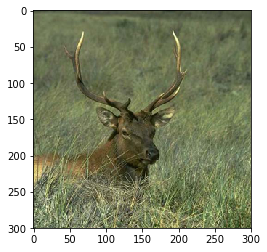

Index 1


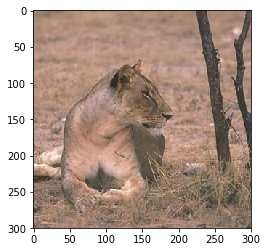

Index 2


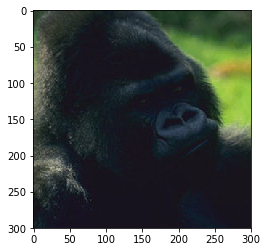

Index 3


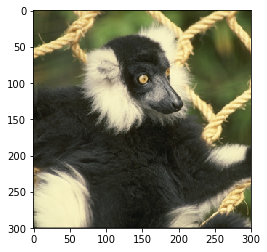

Index 4


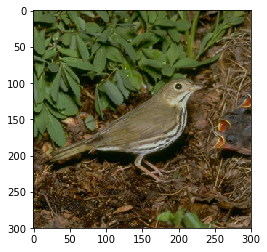

Index 5


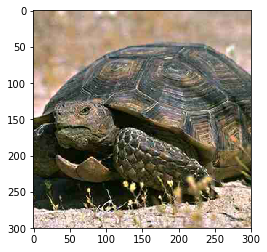

Index 6


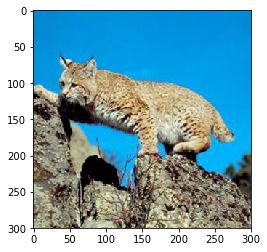

Index 7


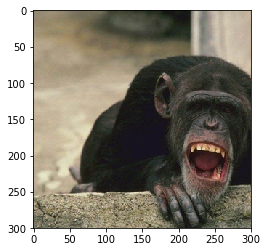

Index 8


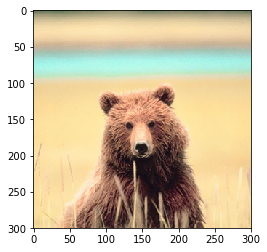

Index 9


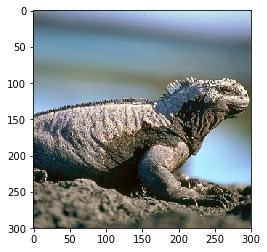

Index 10


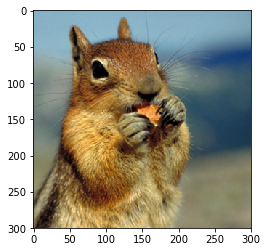

Index 11


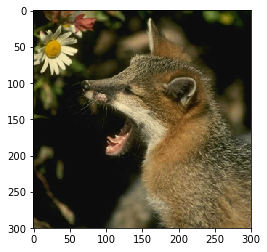

Index 12


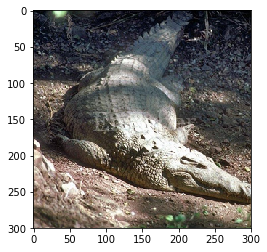

Index 13


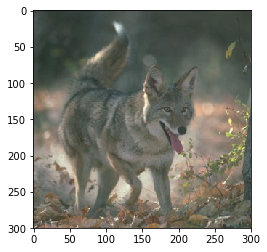

Index 14


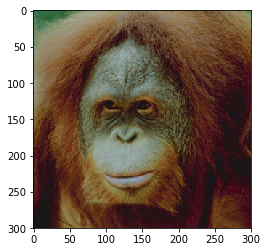

Index 15


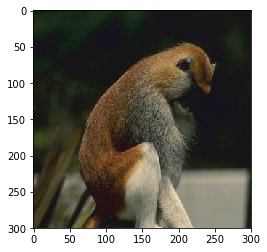

Index 16


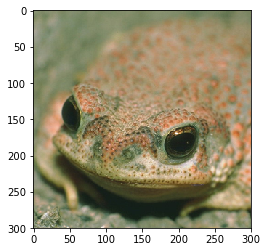

Index 17


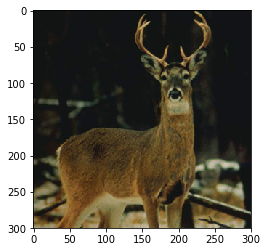

Index 18


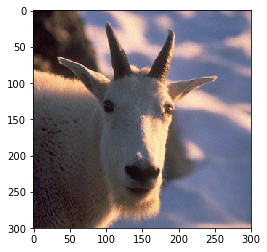

Index 19


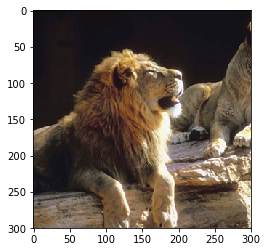

Index 20


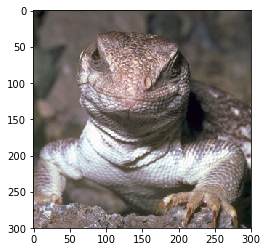

Index 21


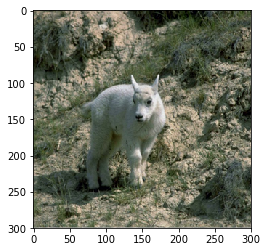

Index 22


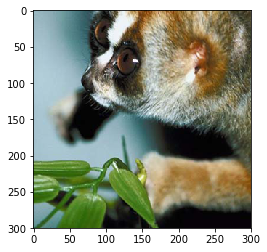

Index 23


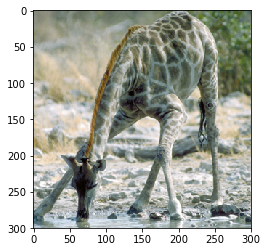

Index 24


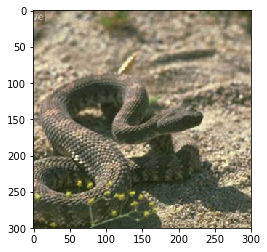

Index 25


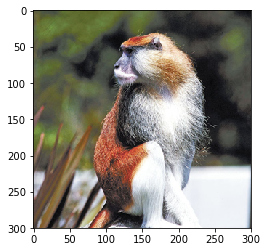

Index 26


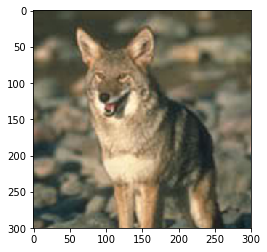

Index 27


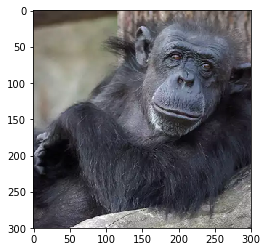

Index 28


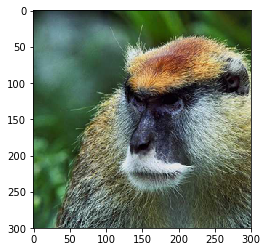

Index 29


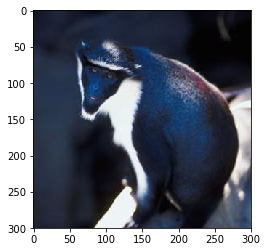

Index 30


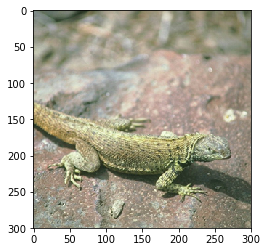

Index 31


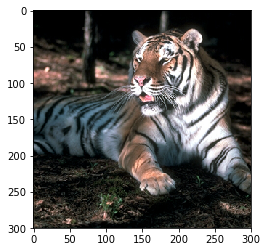

Index 32


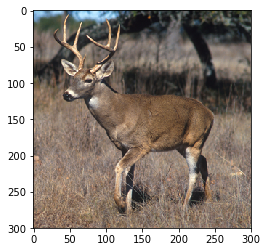

Index 33


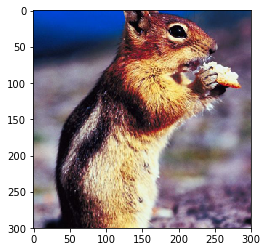

Index 34


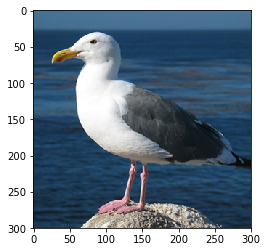

Index 35


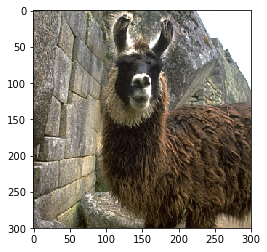

Index 36


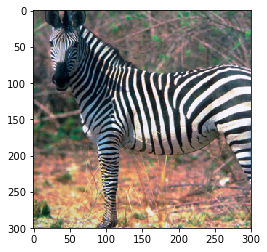

Index 37


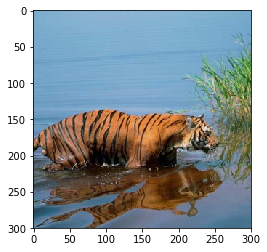

Index 38


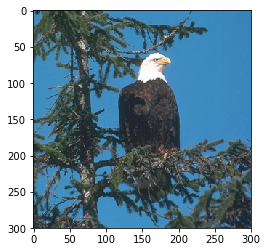

Index 39


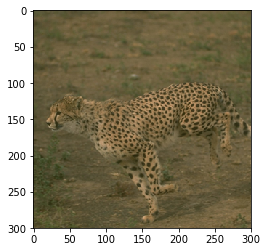

Index 40


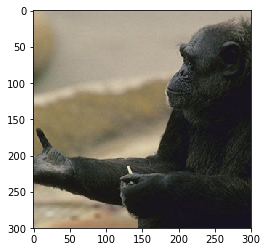

Index 41


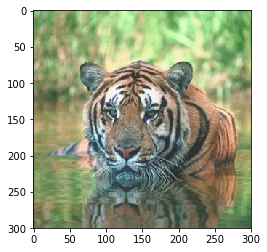

Index 42


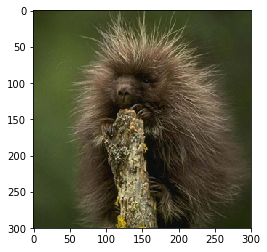

Index 43


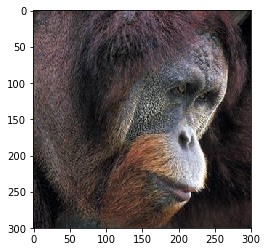

Index 44


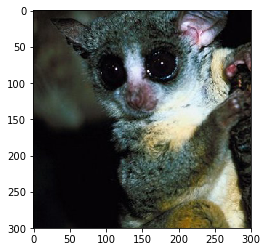

Index 45


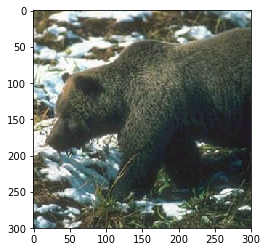

Index 46


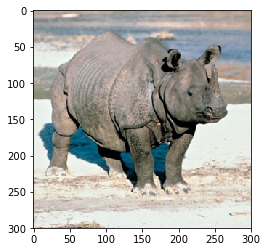

Index 47


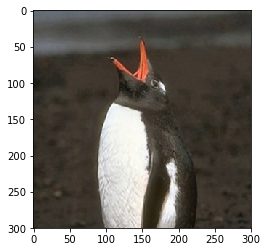

Index 48


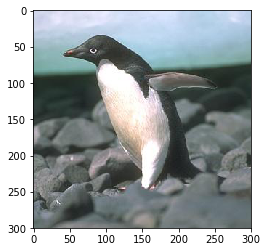

Index 49


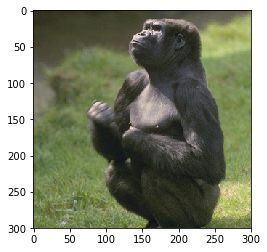

Index 50


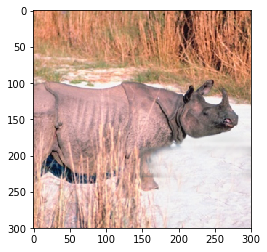

Index 51


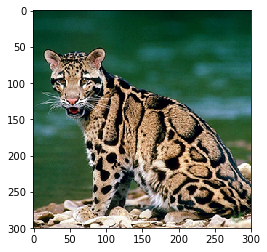

Index 52


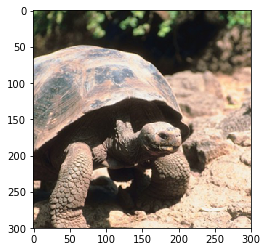

Index 53


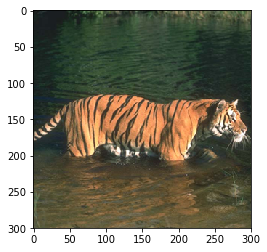

Index 54


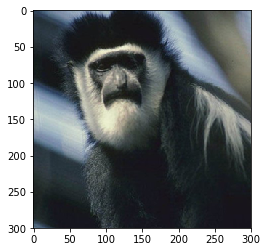

Index 55


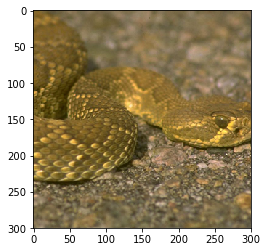

Index 56


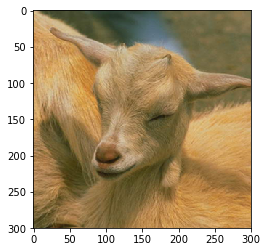

Index 57


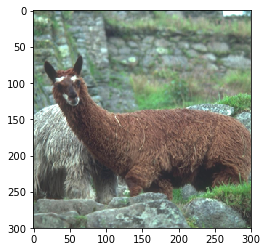

Index 58


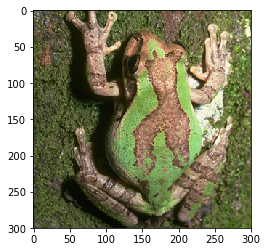

Index 59


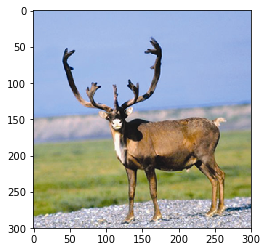

Index 60


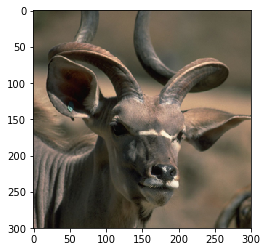

Index 61


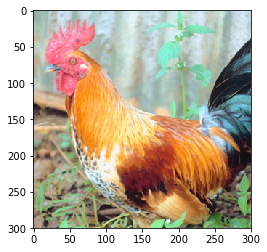

Index 62


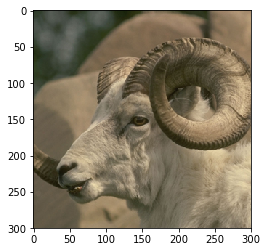

Index 63


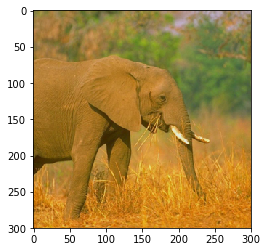

Index 64


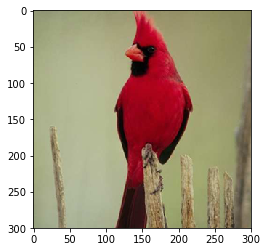

Index 65


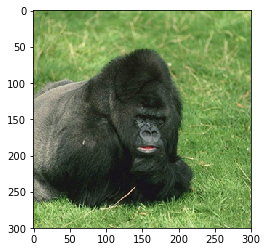

Index 66


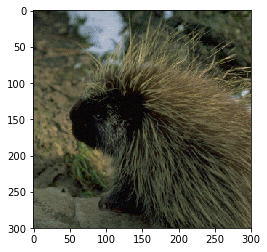

Index 67


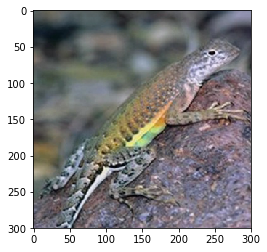

Index 68


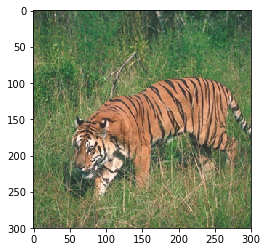

Index 69


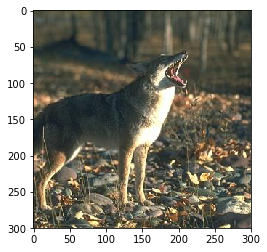

Index 70


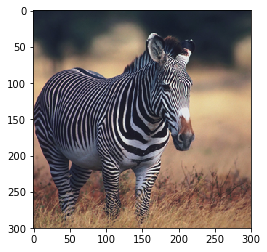

Index 71


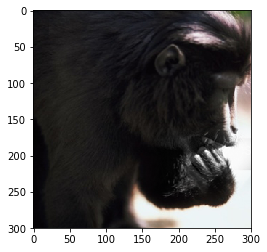

Index 72


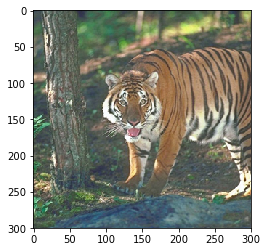

Index 73


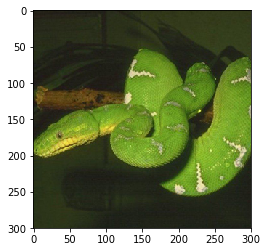

Index 74


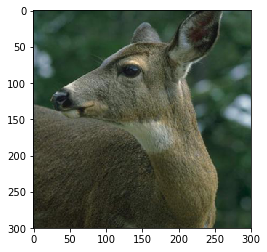

Index 75


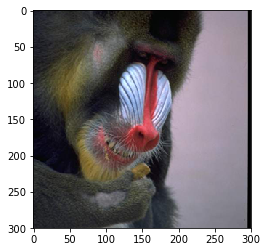

Index 76


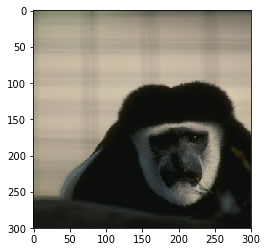

Index 77


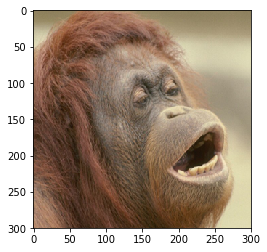

Index 78


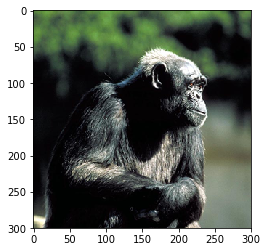

Index 79


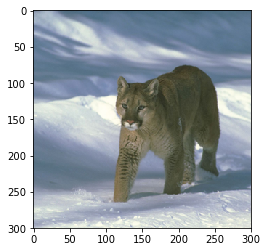

Index 80


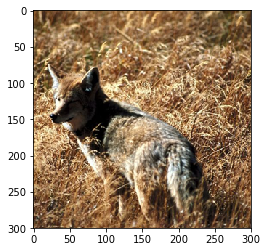

Index 81


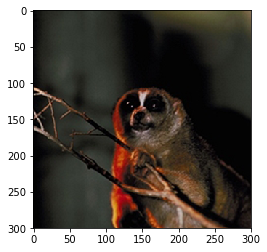

Index 82


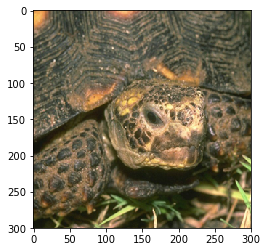

Index 83


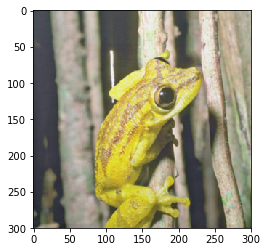

Index 84


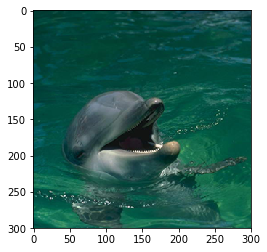

Index 85


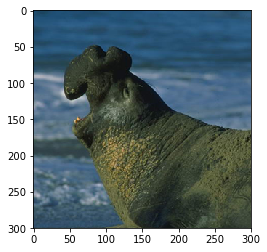

Index 86


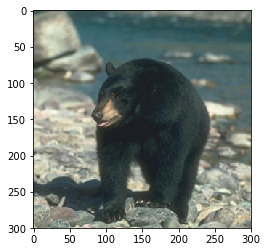

Index 87


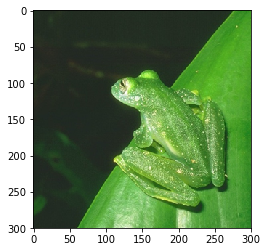

Index 88


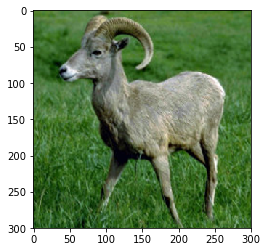

Index 89


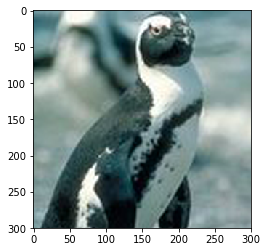

Index 90


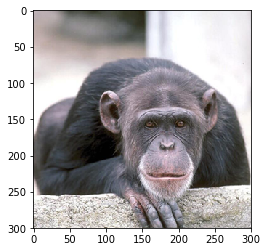

Index 91


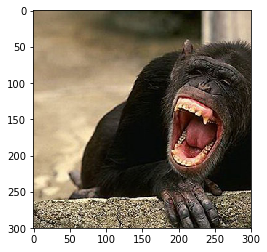

Index 92


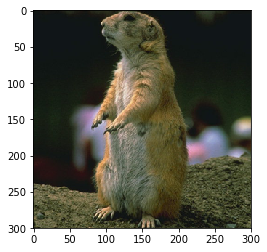

Index 93


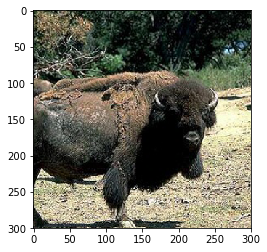

Index 94


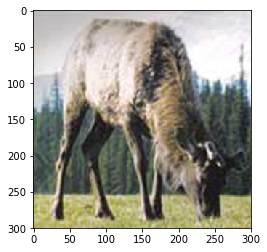

Index 95


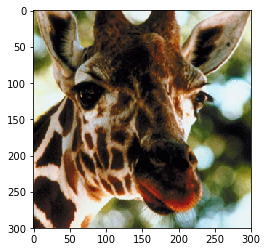

Index 96


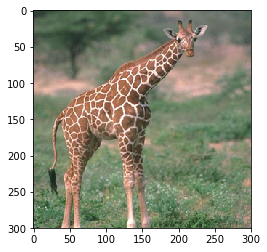

Index 97


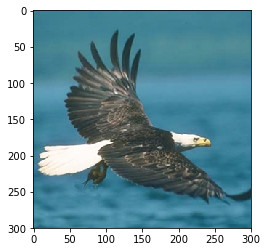

Index 98


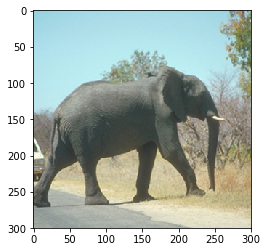

Index 99


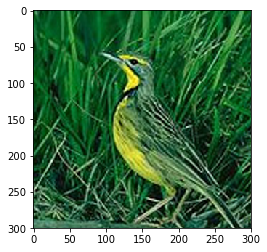

Index 100


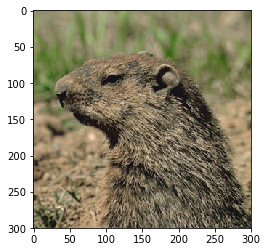

Index 101


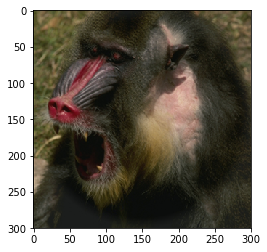

Index 102


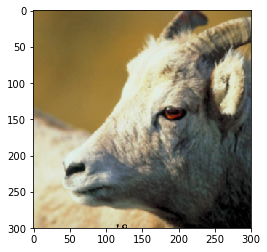

Index 103


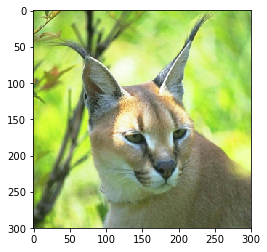

Index 104


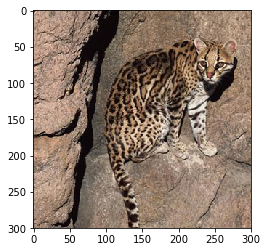

Index 105


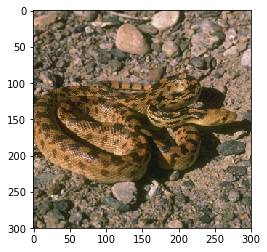

Index 106


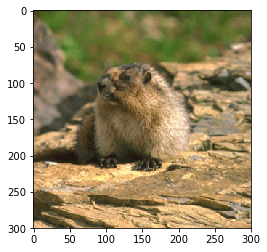

Index 107


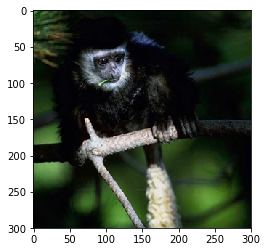

Index 108


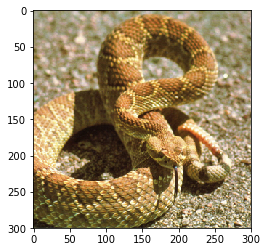

Index 109


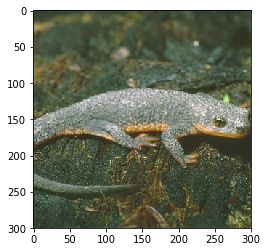

Index 110


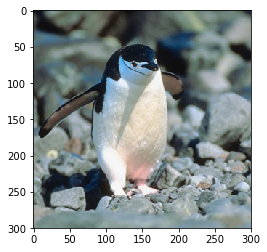

Index 111


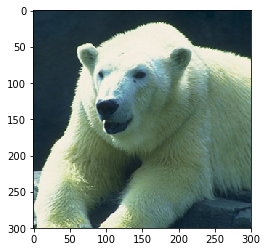

Index 112


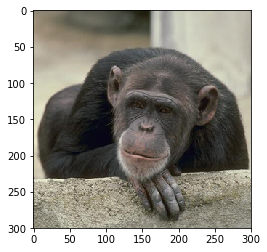

Index 113


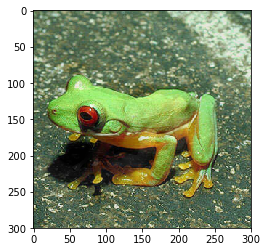

Index 114


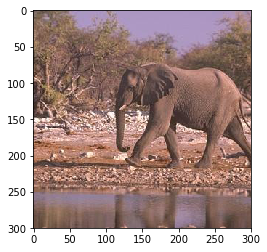

Index 115


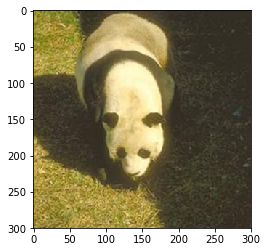

Index 116


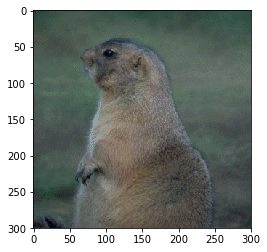

Index 117


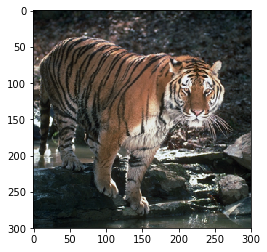

Index 118


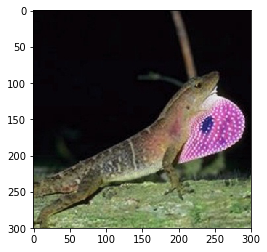

Index 119


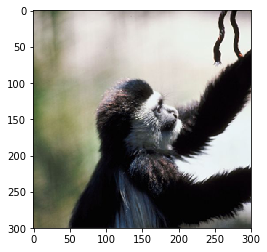

In [7]:
data_dir = 'data/'
filenames = glob.glob(os.path.join(data_dir, '*.png'))

layer = 'fc7'
basic_representations = np.empty([len(filenames), basic_net.blobs[layer].data.shape[1]])
finetune_representations = np.empty([len(filenames), finetune_net.blobs[layer].data.shape[1]])
alexnet_representations = np.empty([len(filenames), alexnet_net.blobs[layer].data.shape[1]])

batches = len(filenames) / batch_size
for i in range(batches):
    # Load the images for the batch
    batch_filenames = filenames[i*batch_size:(i+1)*batch_size]
    for j, f in enumerate(batch_filenames):
        image = caffe.io.load_image(f)
        transformed_image = transformer.preprocess('data', image)
        basic_net.blobs['data'].data[j,:,:,:] = transformed_image
        finetune_net.blobs['data'].data[j,:,:,:] = transformed_image
        alexnet_net.blobs['data'].data[j,:,:,:] = transformed_image
        print('Index {}'.format(str(i*batch_size + j)))
        plt.imshow(image)
        plt.show()
        
    # Extract the representations and insert them into the representations array
    basic_net.forward()
    basic_representations[i*batch_size:(i+1)*batch_size, :] = basic_net.blobs[layer].data
    
    finetune_net.forward()
    finetune_representations[i*batch_size:(i+1)*batch_size, :] = finetune_net.blobs[layer].data
    
    alexnet_net.forward()
    alexnet_representations[i*batch_size:(i+1)*batch_size, :] = alexnet_net.blobs[layer].data


In [16]:
from sklearn.decomposition import PCA

# Basic dendrogram
pca = PCA(n_components=2)
X = pca.fit_transform(alexnet_representations)


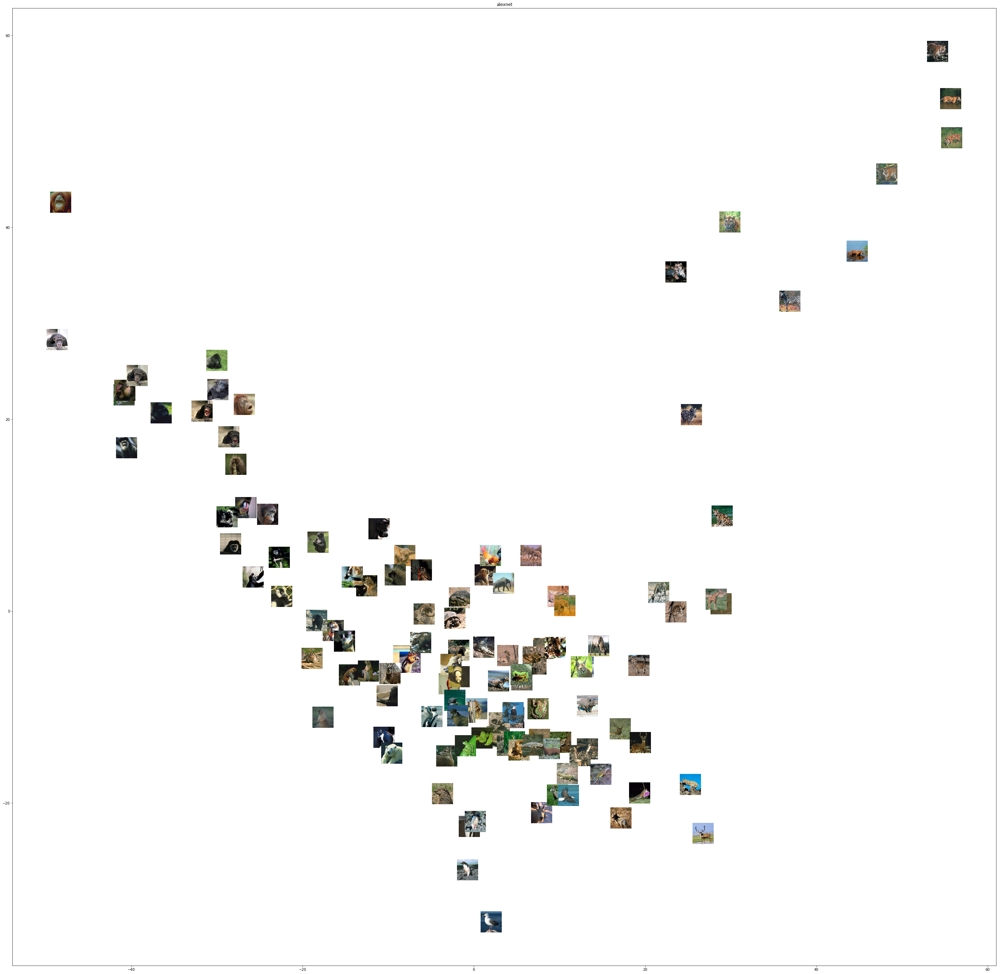

In [73]:
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

fig, ax = plt.subplots(figsize=(50,50))
plt.title('alexnet')
x = X[:,0]
y = X[:,1]
artists = []
for filename, x0, y0 in zip(filenames, x, y):
    image = caffe.io.load_image(filename)
    im = OffsetImage(image, zoom=.2)
    ab = AnnotationBbox(im, (x0, y0), xycoords='data', frameon=False)
    artists.append(ax.add_artist(ab))
ax.update_datalim(np.column_stack([x, y]))
ax.autoscale()
plt.show()